In [1]:
!apt-get install -y openslide-tools
!pip install openslide-python


Reading package lists... Done
Building dependency tree       
Reading state information... Done
openslide-tools is already the newest version (3.4.1+dfsg-4).
0 upgraded, 0 newly installed, 0 to remove and 73 not upgraded.


In [ ]:
import multiresolutionimageinterface as mir
import matplotlib.pyplot as plt
import os.path as osp
import openslide
import matplotlib.pyplot as plt
from pathlib import Path
import glob

slide_path = 'slide_path'
anno_path = 'anno_path'
mask_path = 'mask_path'
tumor_paths = glob.glob(osp.join(slide_path, '*.tif'))
tumor_paths.sort()
anno_tumor_paths = glob.glob(osp.join(anno_path, '*.xml'))
anno_tumor_paths.sort()


reader = mir.MultiResolutionImageReader()
i=0
print("len:",len(tumor_paths))
while i < len(tumor_paths):
    print(i)
    mr_image = reader.open(tumor_paths[i])
    annotation_list=mir.AnnotationList()
    xml_repository = mir.XmlRepository(annotation_list)
    xml_repository.setSource(anno_tumor_paths[i])
    xml_repository.load()
    annotation_mask=mir.AnnotationToMask()
    camelyon17_type_mask = False
    label_map = {'metastases': 1, 'normal': 2} if camelyon17_type_mask else {'_0': 255, '_1': 255, '_2': 0}
    conversion_order = ['metastases', 'normal'] if camelyon17_type_mask else  ['_0', '_1', '_2']
    output_path= osp.join(mask_path, osp.basename(tumor_paths[i]).replace('.tif', '_mask.tif'))
    #annotation_mask.convert(annotation_list, output_path, mr_image.getDimensions(), mr_image.getSpacing(), label_map, conversion_order)
    annotation_mask.convert(annotation_list, output_path, mr_image.getDimensions(), mr_image.getSpacing(), {}, conversion_order)
    i=i+1

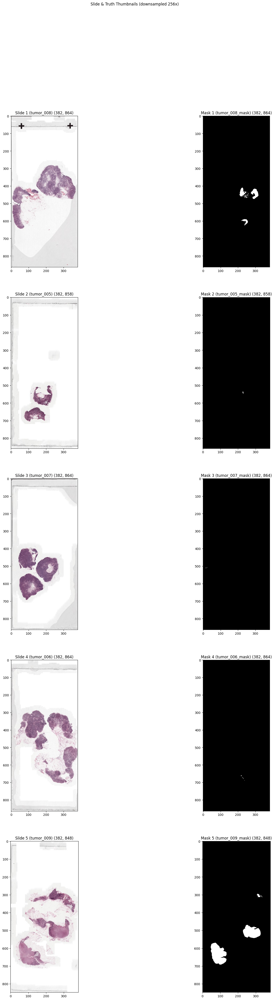

In [2]:
import os
import openslide
import matplotlib.pyplot as plt
from pathlib import Path

# Function to read slides and masks
def read_slides_and_masks(slide_folder_path, mask_folder_path):
    slide_paths = [slide_folder_path / file for file in os.listdir(slide_folder_path) if file.endswith('.tif')]
    mask_paths = [mask_folder_path / f'{file.stem}_mask.tif' for file in slide_paths]
    slides = [openslide.open_slide(slide_path) for slide_path in slide_paths]
    
    masks = [openslide.open_slide(mask_path) for mask_path in mask_paths]

    slide_names = [file.stem for file in slide_paths]
    mask_names = [f'{file.stem}_mask' for file in slide_paths]

    return slides, slide_names, masks, mask_names

# Function to generate and display thumbnails
def display_thumbnails(slides, slide_names, masks, mask_names):
    n_slides = len(slides)
    f, axes = plt.subplots(n_slides, 2, figsize=(20, 10 * n_slides))
    axes = axes.ravel()

    for i, (slide, slide_name, mask, mask_name) in enumerate(zip(slides, slide_names, masks, mask_names)):
        thumbnail_slide = slide.get_thumbnail((slide.dimensions[0] // 256, slide.dimensions[1] // 256))
        thumbnail_mask = mask.get_thumbnail((mask.dimensions[0] // 256, mask.dimensions[1] // 256))

        axes[i * 2].imshow(thumbnail_slide)
        axes[i * 2].set_title(f'Slide {i + 1} ({slide_name}) {thumbnail_slide.size}')

        axes[i * 2 + 1].imshow(thumbnail_mask.convert('L'), cmap='gray')
        axes[i * 2 + 1].set_title(f'Mask {i + 1} ({mask_name}) {thumbnail_mask.size}')

    f.suptitle('Slide & Truth Thumbnails (downsampled 256x)')
    plt.show()

# Specify the folder paths for slides and masks
slide_folder_path = Path('/kaggle/input/camelyon/')
mask_folder_path = Path('/kaggle/input/camelyon/mask/mask/')

# Read slides and masks
slides, slide_names, masks, mask_names = read_slides_and_masks(slide_folder_path, mask_folder_path)

# Display thumbnails
display_thumbnails(slides, slide_names, masks, mask_names)


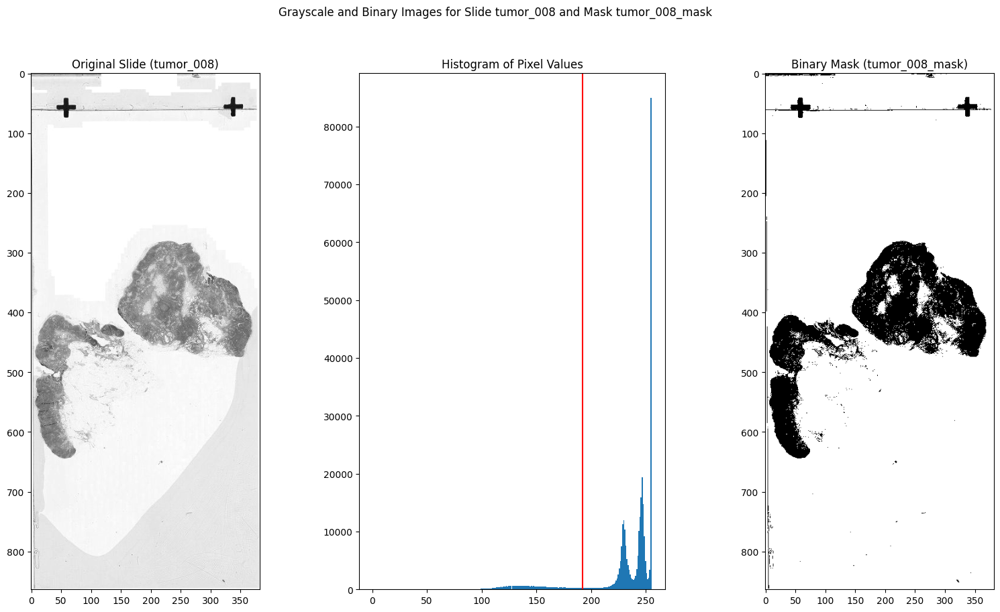

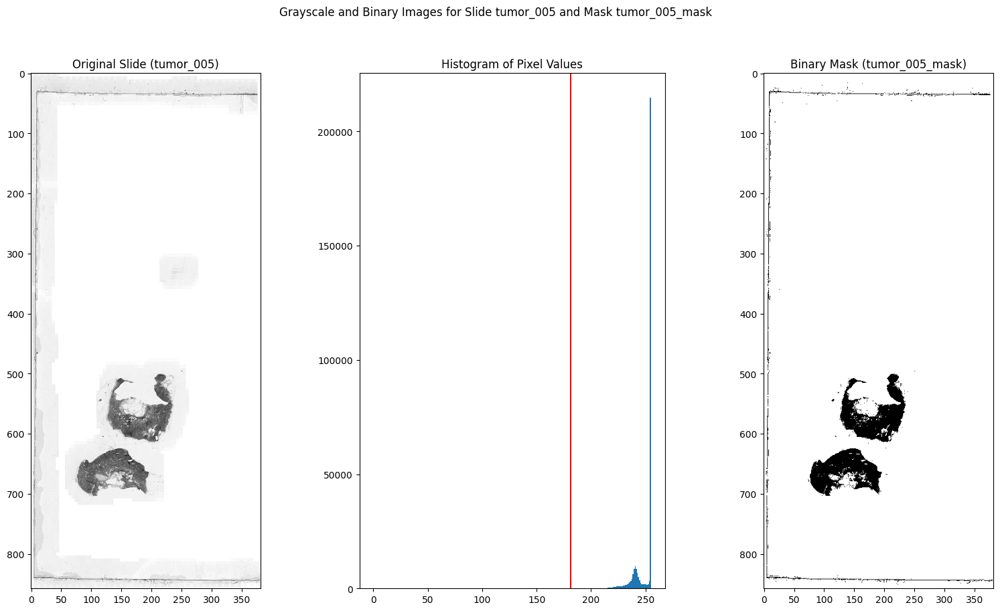

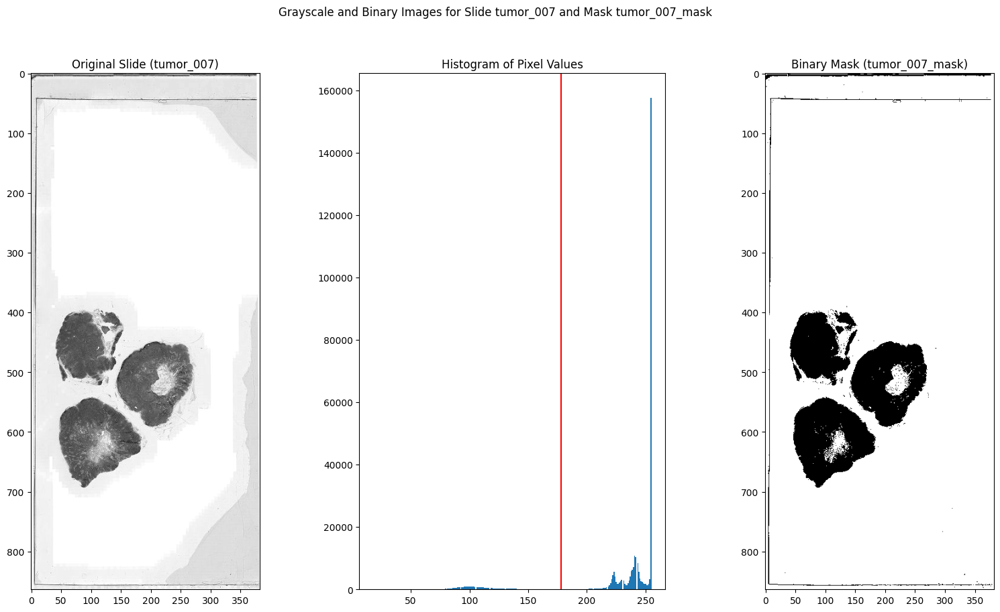

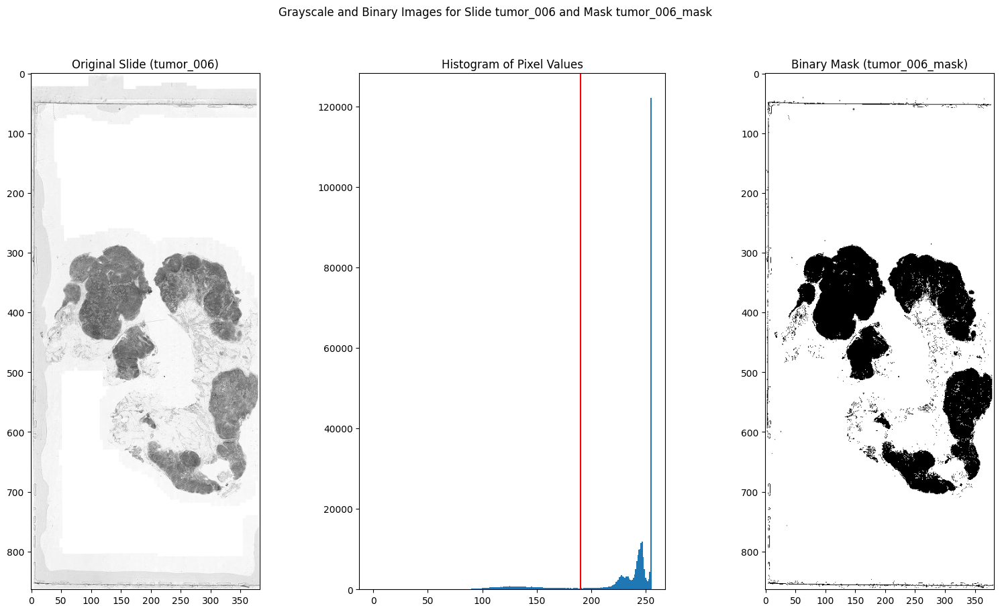

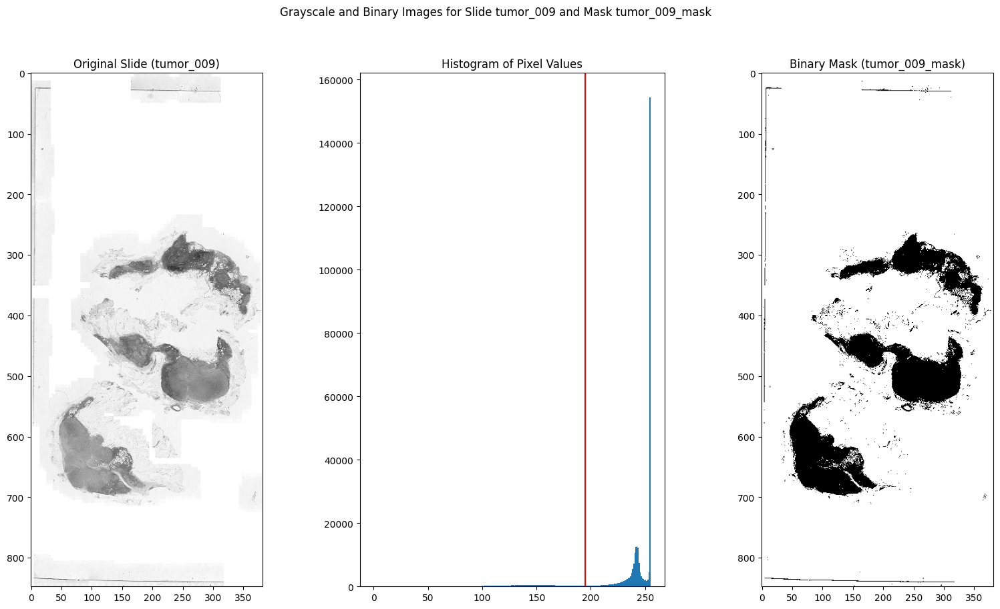

In [3]:
from skimage.filters import threshold_otsu
import numpy as np
# Function to display grayscale and binary images
def display_images(slide, mask, slide_name, mask_name):
    img = np.array(slide.convert('L'))  # Convert to grayscale
    thresh = threshold_otsu(img)
    binary = img > thresh

    f, axes = plt.subplots(1, 3, figsize=(20, 10))
    ax = axes.ravel()
    ax[0].imshow(img, cmap='gray')
    ax[0].set_title(f'Original Slide ({slide_name})')

    ax[1].hist(img.ravel(), bins=256)
    ax[1].set_title('Histogram of Pixel Values')
    ax[1].axvline(thresh, color='r')

    ax[2].imshow(binary, cmap='gray')
    ax[2].set_title(f'Binary Mask ({mask_name})')

    f.suptitle(f'Grayscale and Binary Images for Slide {slide_name} and Mask {mask_name}')
    plt.show()

# Iterate over slides and masks
for slide, slide_name, mask, mask_name in zip(slides, slide_names, masks, mask_names):
    thumbnail_slide = slide.get_thumbnail((slide.dimensions[0] // 256, slide.dimensions[1] // 256))
    thumbnail_mask = mask.get_thumbnail((mask.dimensions[0] // 256, mask.dimensions[1] // 256))

    display_images(thumbnail_slide, thumbnail_mask, slide_name, mask_name)


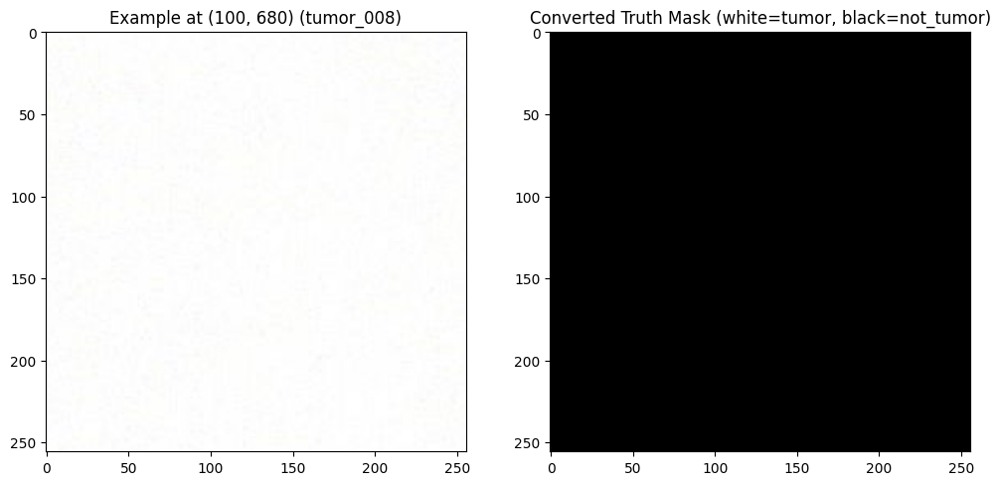

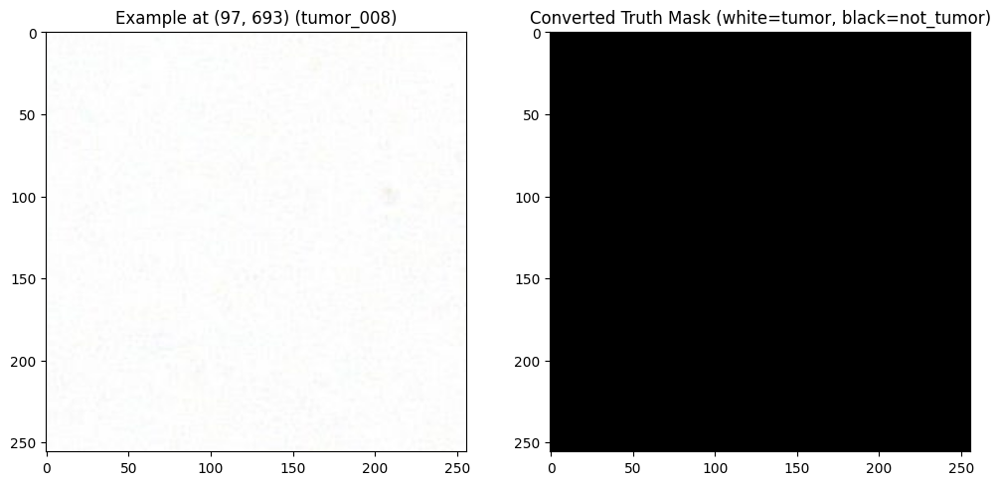

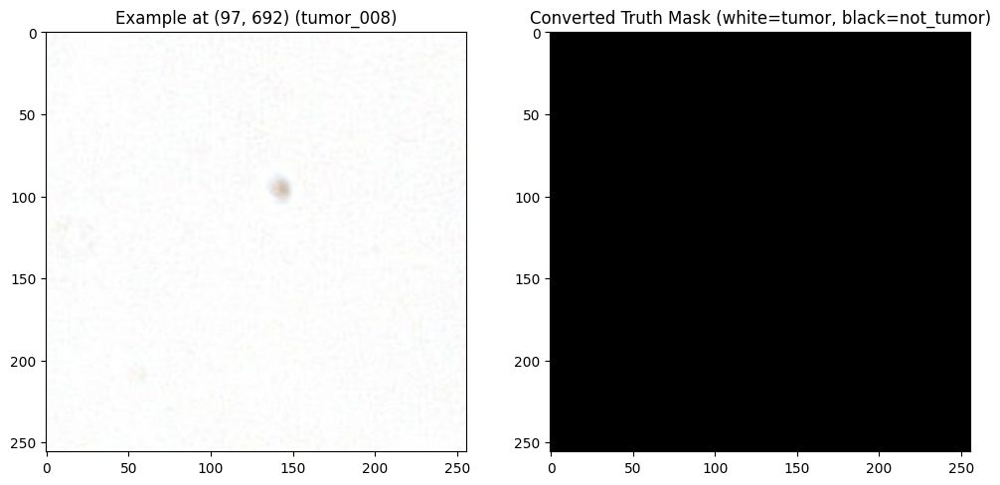

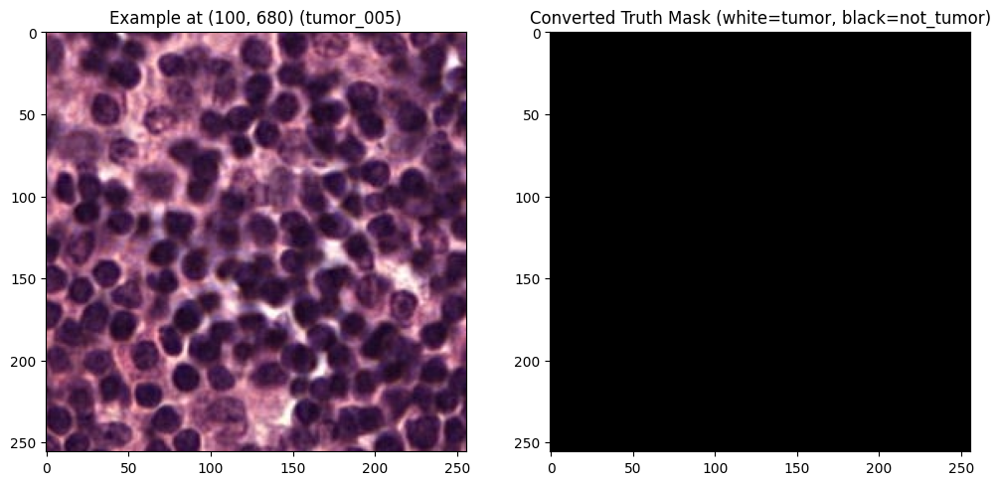

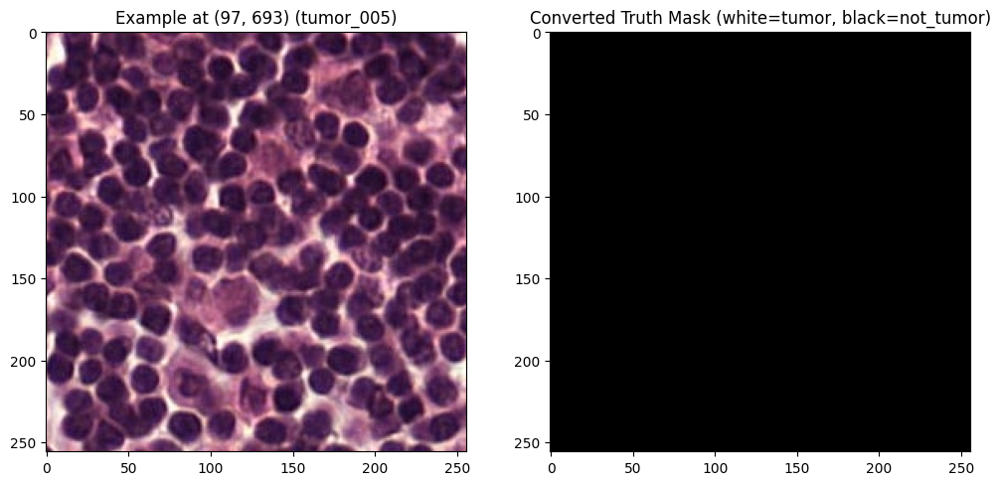

...

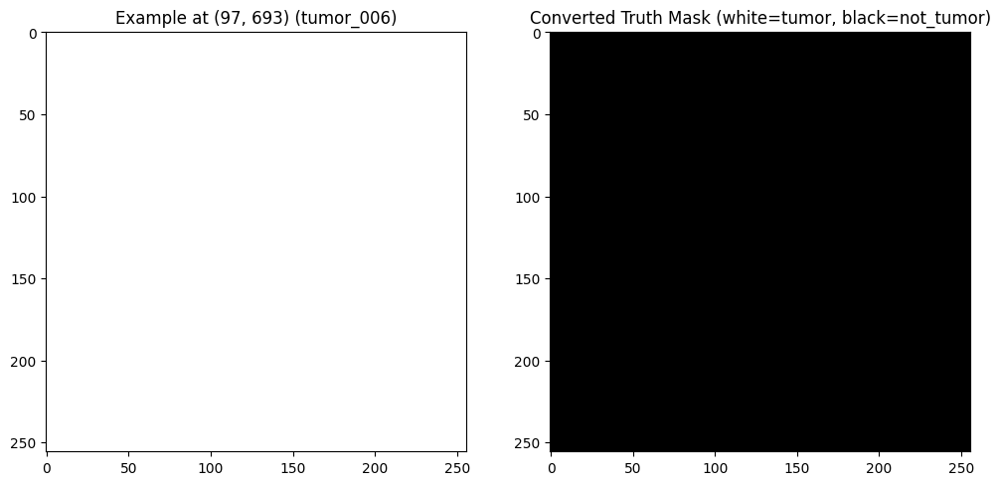

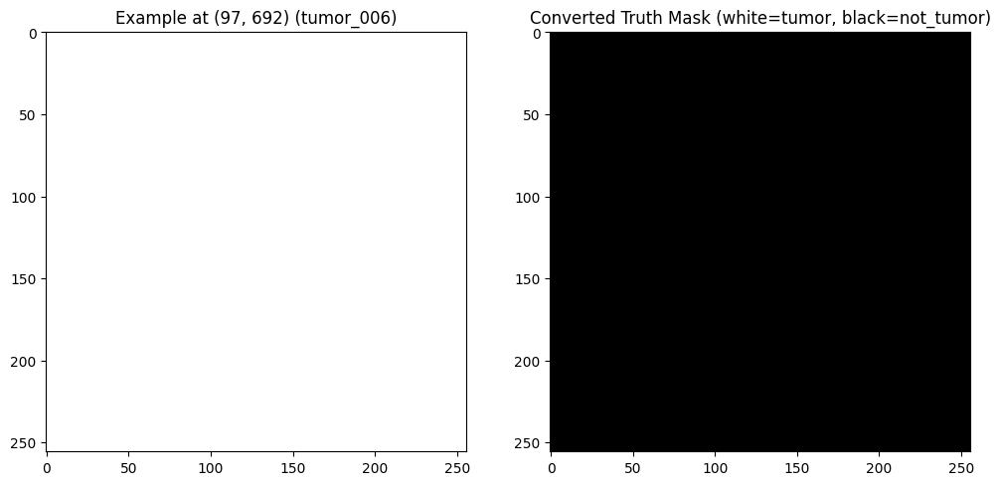

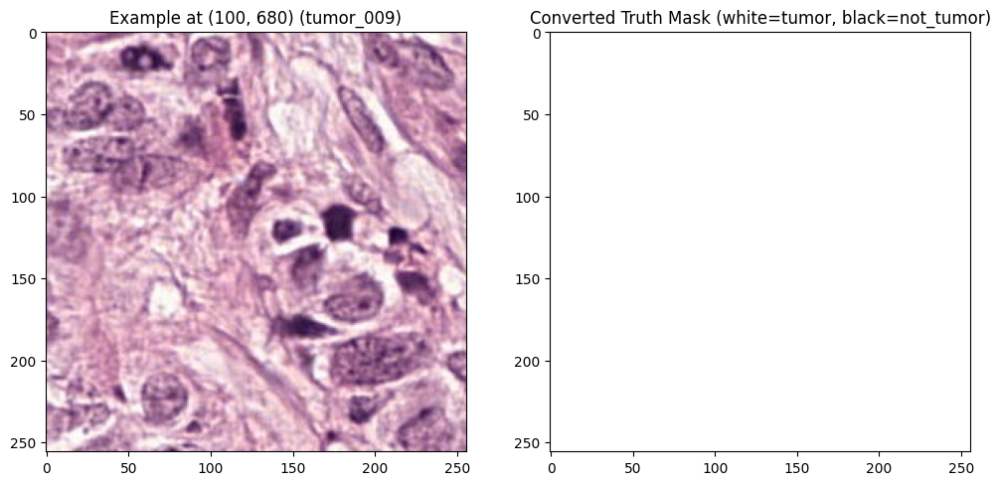

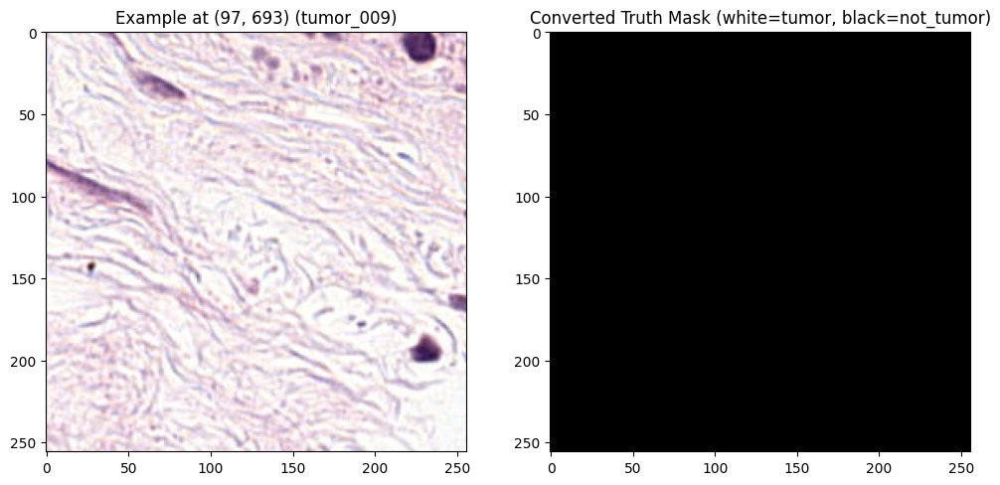

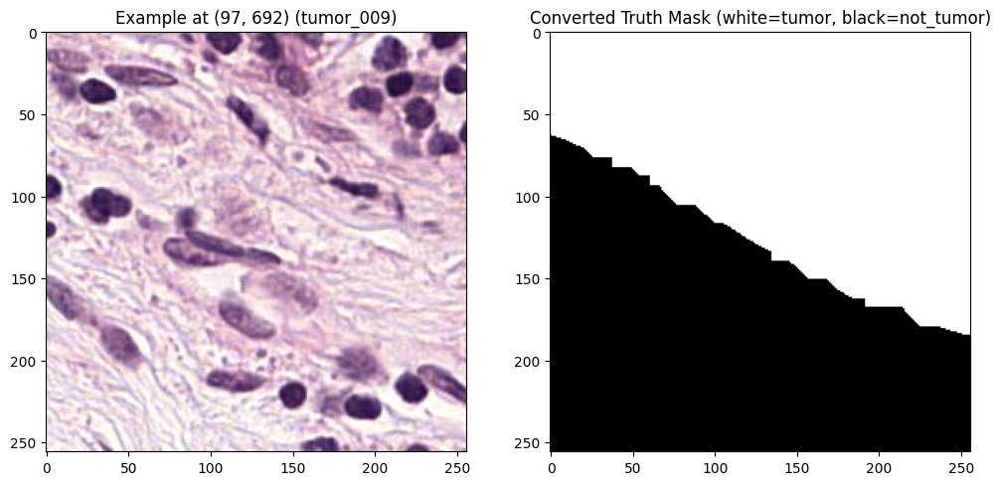

In [4]:
from openslide.deepzoom import DeepZoomGenerator

# Iterate over slides and masks
for slide, slide_name, mask, mask_name in zip(slides, slide_names, masks, mask_names):
    tiles = DeepZoomGenerator(slide, tile_size=256, overlap=0, limit_bounds=False)
    tiles_truth = DeepZoomGenerator(mask, tile_size=256, overlap=0, limit_bounds=False)

    # Define a list of coordinates for examples
    example_coordinates = [(100, 680), (97, 693), (97, 692)]

    # Display all examples
    for coord in example_coordinates:
        # Get the example tile and truth mask
        example_tile = tiles.get_tile(tiles.level_count-1, coord)
        example_truth_tile = tiles_truth.get_tile(tiles_truth.level_count-1, coord)

        # Convert the tiles to numpy arrays
        example_array = np.array(example_tile)
        example_truth_array = np.array(example_truth_tile)

        # Convert the truth mask to a single-channel image (grayscale)
        example_truth_gray = example_truth_array[:, :, 0]

        # Display the images
        f, axes = plt.subplots(1, 2, figsize=(12, 6))
        axes[0].imshow(example_tile)
        axes[0].set_title(f'Example at {coord} ({slide_name})')
        axes[1].imshow(example_truth_gray, cmap='gray', vmin=0, vmax=1)  # Explicitly set colormap and normalize
        axes[1].set_title('Converted Truth Mask (white=tumor, black=not_tumor)')
        plt.show()


In [5]:
import os.path as osp
import pandas as pd

BASE_TRUTH_DIR='/kaggle/input/camelyon/mask/mask'
def find_patches_from_slide(slide_path, base_truth_dir=BASE_TRUTH_DIR, filter_non_tissue=True):
    """Returns a dataframe of all patches in slide
    input: slide_path: path to WSI file
    output: samples: dataframe with the following columns:
        slide_path: path of slide
        is_tissue: sample contains tissue
        is_tumor: truth status of sample
        tile_loc: coordinates of samples in slide


    option: base_truth_dir: directory of truth slides
    option: filter_non_tissue: Remove samples no tissue detected
    """
    base_truth_dir = Path(base_truth_dir)
    slide_contains_tumor = osp.basename(slide_path).startswith('tumor_')

    with openslide.open_slide(slide_path) as slide:
        thumbnail = slide.get_thumbnail((slide.dimensions[0] / 256, slide.dimensions[1] / 256))

    thumbnail_grey = np.array(thumbnail.convert('L')) # convert to grayscale
    thresh = threshold_otsu(thumbnail_grey)

    binary = thumbnail_grey > thresh

    patches = pd.DataFrame(pd.DataFrame(binary).stack())
    patches['is_tissue'] = ~patches[0]
    patches.drop(0, axis=1, inplace=True)
    patches['slide_path'] = slide_path

    if slide_contains_tumor:

        truth_slide_path = base_truth_dir / osp.basename(slide_path).replace('.tif', '_mask.tif')
        with openslide.open_slide(str(truth_slide_path)) as truth:
            thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 256, truth.dimensions[1] / 256))
            thumbnail_truth_grey = np.array(thumbnail_truth.convert('L')) # convert to grayscale
            thresh_truth = threshold_otsu(thumbnail_truth_grey)

            binary_truth = thumbnail_truth_grey > thresh_truth
        patches_y = pd.DataFrame(pd.DataFrame(binary_truth).stack())
        patches_y['is_tumor'] = patches_y[0] > 0

        patches_y.drop(0, axis=1, inplace=True)

        samples = pd.concat([patches, patches_y], axis=1)
    else:
        samples = patches
        samples['is_tumor'] = False

    if filter_non_tissue:
        samples = samples[samples.is_tissue == True] # remove patches with no tissue
    samples['tile_loc'] = list(samples.index)
    samples.reset_index(inplace=True, drop=True)
    return samples

# Specify the directory containing slides and masks
data_dir = '/kaggle/input/camelyon'
slides_dir = data_dir 
masks_dir = data_dir + '/mask/mask'

# Get a list of slide and mask paths
slide_paths = sorted(Path(slides_dir).glob('*.tif'))
mask_paths = sorted(Path(masks_dir).glob('*_mask.tif'))

# Initialize an empty list to store results for each slide
all_samples_list = []

# Iterate over slides and masks
for slide_path, mask_path in zip(slide_paths, mask_paths):
    # Load slide and mask
    slide = openslide.open_slide(str(slide_path))
    mask = openslide.open_slide(str(mask_path))

    # Find patches from the slide
    all_tissue_samples = find_patches_from_slide(slide_path, base_truth_dir=masks_dir)

    # Append the samples for the current slide to the list
    all_samples_list.append(all_tissue_samples)

    print(f'Total patches in slide {slide_path.name}: {len(all_tissue_samples)}')
    print(all_tissue_samples.is_tumor.value_counts())

# Combine results for all slides into a single DataFrame
all_samples = pd.concat(all_samples_list, ignore_index=True)

# Print summary information for all slides
print('Total patches in all slides:', len(all_samples))
all_samples.iloc[:10]
print(all_samples.is_tumor.value_counts())




Total patches in slide tumor_005.tif: 13212
is_tumor
False    13174
True        38
Name: count, dtype: int64
Total patches in slide tumor_006.tif: 48542
is_tumor
False    48514
True        28
Name: count, dtype: int64
Total patches in slide tumor_007.tif: 36245
is_tumor
False    36245
Name: count, dtype: int64
Total patches in slide tumor_008.tif: 39231
is_tumor
False    37990
True      1241
Name: count, dtype: int64
Total patches in slide tumor_009.tif: 34653
is_tumor
False    21893
True     12760
Name: count, dtype: int64
Total patches in all slides: 171883
is_tumor
False    157816
True      14067
Name: count, dtype: int64


In [7]:
num_unique_slides = all_samples['slide_path'].nunique()
print(f"Number of unique slide paths: {num_unique_slides}")

Number of unique slide paths: 5


In [8]:
import cv2
from tensorflow.keras.utils import to_categorical

BASE_TRUTH_DIR='/kaggle/input/camelyon/mask/mask'
NUM_CLASSES = 2 # not_tumor, tumor

def gen_imgs(samples, batch_size, base_truth_dir=BASE_TRUTH_DIR, shuffle=True):
    """This function returns a generator that
    yields tuples of (
        X: tensor, float - [batch_size, 256, 256, 3]
        y: tensor, int32 - [batch_size, 256, 256, NUM_CLASSES]
    )


    input: samples: samples dataframe
    input: batch_size: The number of images to return for each pull
    output: yield (X_train, y_train): generator of X, y tensors

    option: base_truth_dir: path, directory of truth slides
    option: shuffle: bool, if True shuffle samples
    """

    num_samples = len(samples)
    while 1: # Loop forever so the generator never terminates
        if shuffle:
            samples = samples.sample(frac=1) # shuffle samples

        for offset in range(0, num_samples, batch_size):
            batch_samples = samples.iloc[offset:offset+batch_size]

            images = []
            masks = []
            for _, batch_sample in batch_samples.iterrows():
                slide_contains_tumor = osp.basename(batch_sample.slide_path).startswith('tumor_')

                with openslide.open_slide(batch_sample.slide_path) as slide:
                    tiles = DeepZoomGenerator(slide, tile_size=256, overlap=0, limit_bounds=False)
                    img = tiles.get_tile(tiles.level_count-1, batch_sample.tile_loc[::-1])

                # only load truth mask for tumor slides
                if slide_contains_tumor:

                    base_truth_dir = Path(base_truth_dir)  # Convert base_truth_dir to a Path object
                    truth_slide_path = base_truth_dir / osp.basename(batch_sample.slide_path).replace('.tif', '_mask.tif')


                    with openslide.open_slide(str(truth_slide_path)) as truth:
                        truth_tiles = DeepZoomGenerator(truth, tile_size=256, overlap=0, limit_bounds=False)
                        mask = truth_tiles.get_tile(truth_tiles.level_count-1, batch_sample.tile_loc[::-1])


                        # Convert the tiles to numpy arrays

                        mask = np.array(mask)

                        # Convert the truth mask to a single-channel image (grayscale)
                        mask = mask[:, :, 0]


                else:
                    mask = np.zeros((256, 256))

                images.append(np.array(img))
                masks.append(mask)

            X_train = np.array(images)
            y_train = np.array(masks)
            y_train = to_categorical(y_train, num_classes=2).reshape(y_train.shape[0], 256, 256, 2)
            yield X_train, y_train

In [10]:
sample_gen = gen_imgs(all_samples.sample(32, random_state=42), 32, shuffle=False)

In [11]:

%time example_X, example_y  = next(sample_gen)

CPU times: user 1.01 s, sys: 329 ms, total: 1.34 s
Wall time: 3.66 s


In [12]:
example_X.shape

(32, 256, 256, 3)

In [13]:
example_y.shape

(32, 256, 256, 2)

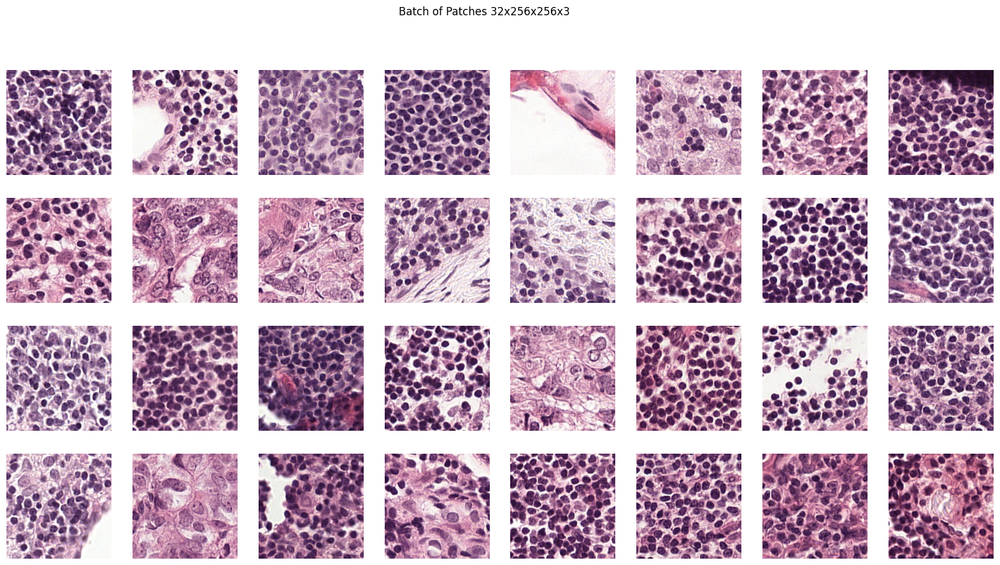

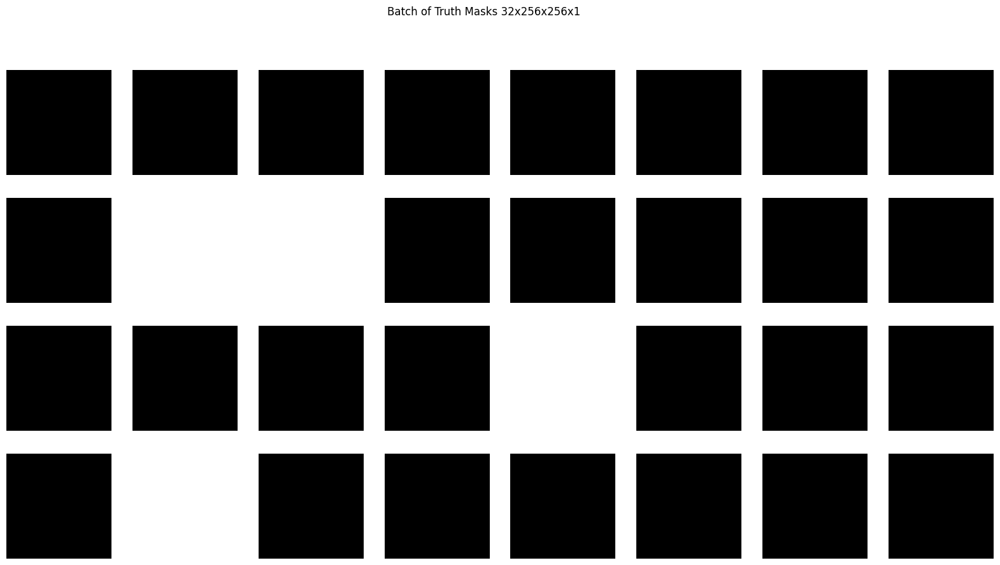

In [14]:
f, axes = plt.subplots(4, 8, figsize=(20, 10));
ax = axes.flatten()
for i in range(0, example_X.shape[0]):
    _ = ax[i].imshow(example_X[i]);
    _ = ax[i].axis('off');
f.suptitle('Batch of Patches 32x256x256x3');

f, axes = plt.subplots(4, 8, figsize=(20, 10));
ax = axes.flatten()
for i in range(0, example_X.shape[0]):
    _ = ax[i].imshow(example_y[i].argmax(axis=2), cmap='gray', vmin=0, vmax=1);
    _ = ax[i].axis('off');
f.suptitle('Batch of Truth Masks 32x256x256x1');

In [15]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Lambda, Dropout, Conv2D, Conv2DTranspose
from tensorflow.keras.layers import MaxPooling2D


model = Sequential()
model.add(Lambda(lambda x: x / 255.0 - 0.5, input_shape=(256, 256, 3)))
model.add(Conv2D(100, (5, 5), strides=(2, 2), activation='elu', padding='same'))
model.add(MaxPooling2D())
model.add(Conv2D(200, (5, 5), strides=(2, 2), activation='elu', padding='same'))
model.add(MaxPooling2D())
model.add(Conv2D(300, (3, 3), activation='elu', padding='same'))
model.add(Conv2D(300, (3, 3), activation='elu',  padding='same'))
model.add(Dropout(0.1))
model.add(Conv2D(2, (1, 1))) # this is called upscore layer for some reason?
model.add(Conv2DTranspose(2, (31, 31), strides=(16, 16), activation='softmax', padding='same'))

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [16]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda (Lambda)             (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 100)     7600      
                                                                 
 max_pooling2d (MaxPooling2  (None, 64, 64, 100)       0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 200)       500200    
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 16, 16, 200)       0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 300)       5

/tmp/ipykernel_43/801816654.py:38: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_generator, np.ceil(len(train_samples) / BATCH_SIZE),


Epoch 1/15
250/250 [==============================] - 1439s 6s/step - loss: 0.1709 - accuracy: 0.9325 - val_loss: 0.1681 - val_accuracy: 0.9404
Epoch 2/15
250/250 [==============================] - 1389s 6s/step - loss: 0.1484 - accuracy: 0.9483 - val_loss: 0.1258 - val_accuracy: 0.9527
Epoch 3/15
250/250 [==============================] - 1350s 5s/step - loss: 0.1307 - accuracy: 0.9559 - val_loss: 0.1307 - val_accuracy: 0.9570
Epoch 4/15
250/250 [==============================] - 1349s 5s/step - loss: 0.1251 - accuracy: 0.9587 - val_loss: 0.1099 - val_accuracy: 0.9615
Epoch 5/15
250/250 [==============================] - 1413s 6s/step - loss: 0.1161 - accuracy: 0.9612 - val_loss: 0.0947 - val_accuracy: 0.9679
Epoch 6/15
250/250 [==============================] - 1313s 5s/step - loss: 0.1104 - accuracy: 0.9641 - val_loss: 0.1278 - val_accuracy: 0.9605
Epoch 7/15
250/250 [==============================] - 1232s 5s/step - loss: 0.1080 - accuracy: 0.9644 - val_loss: 0.0992 - val_accuracy:

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


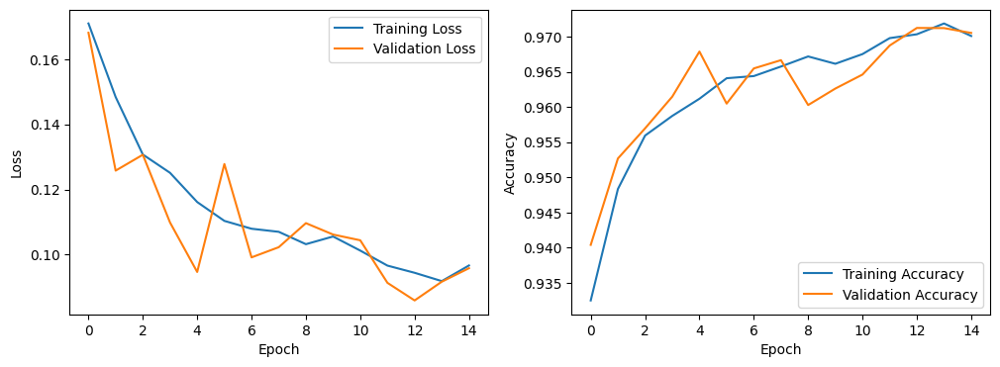

In [63]:
from sklearn.model_selection import train_test_split
from datetime import datetime
import matplotlib.pyplot as plt

BATCH_SIZE = 32
N_EPOCHS = 15

NUM_SAMPLES_PER_SLIDE = 2000

# Create an empty DataFrame to store samples from all slides
all_samples = pd.DataFrame()

# Iterate over each slide and mask
for slide_path, mask_path in zip(slide_paths, mask_paths):

    # Find patches from the current slide
    samples = find_patches_from_slide(slide_path, base_truth_dir="/kaggle/input/camelyon/mask/mask")

    # Sample a fixed number of patches per slide
    samples = samples.sample(NUM_SAMPLES_PER_SLIDE, random_state=42)

    # Concatenate the samples to the DataFrame containing samples from all slides
    all_samples = pd.concat([all_samples, samples], ignore_index=True)

# Split samples into train and validation sets
train_samples, validation_samples = train_test_split(all_samples, test_size=0.2, stratify=all_samples["is_tumor"], random_state=42)

## TODO Add checkpoint mechanism to save old model before generating new

# Create generators for training and validation
train_generator = gen_imgs(train_samples, BATCH_SIZE)
validation_generator = gen_imgs(validation_samples, BATCH_SIZE)

# Train model
train_start_time = datetime.now()

# Store the training history for later plotting
history = model.fit_generator(train_generator, np.ceil(len(train_samples) / BATCH_SIZE),
    validation_data=validation_generator,
    validation_steps=np.ceil(len(validation_samples) / BATCH_SIZE),
    epochs=N_EPOCHS)

train_end_time = datetime.now()
print("Model training time: %.1f minutes" % ((train_end_time - train_start_time).seconds / 60,))

# Save model
model.save('/kaggle/working/my5slidemodel2.h5')
# Plot the training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.show()


/tmp/ipykernel_42/801816654.py:38: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_generator, np.ceil(len(train_samples) / BATCH_SIZE),


Epoch 1/15
250/250 [==============================] - 1518s 6s/step - loss: 0.2381 - accuracy: 0.9093 - val_loss: 0.1789 - val_accuracy: 0.9190
Epoch 2/15
250/250 [==============================] - 1334s 5s/step - loss: 0.1847 - accuracy: 0.9261 - val_loss: 0.1457 - val_accuracy: 0.9382
Epoch 3/15
250/250 [==============================] - 1321s 5s/step - loss: 0.1609 - accuracy: 0.9391 - val_loss: 0.1689 - val_accuracy: 0.9380
Epoch 4/15
250/250 [==============================] - 1287s 5s/step - loss: 0.1436 - accuracy: 0.9494 - val_loss: 0.1134 - val_accuracy: 0.9610
Epoch 5/15
250/250 [==============================] - 1264s 5s/step - loss: 0.1293 - accuracy: 0.9557 - val_loss: 0.1261 - val_accuracy: 0.9585
Epoch 6/15
250/250 [==============================] - 1111s 4s/step - loss: 0.1223 - accuracy: 0.9591 - val_loss: 0.1087 - val_accuracy: 0.9603
Epoch 7/15
250/250 [==============================] - 996s 4s/step - loss: 0.1188 - accuracy: 0.9611 - val_loss: 0.1131 - val_accuracy: 

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


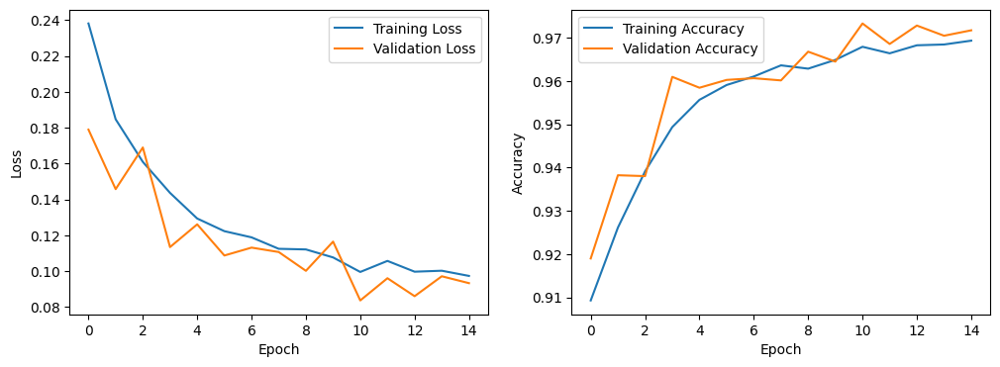

In [16]:
from sklearn.model_selection import train_test_split
from datetime import datetime
import matplotlib.pyplot as plt

BATCH_SIZE = 32
N_EPOCHS = 15

NUM_SAMPLES_PER_SLIDE = 2000

# Create an empty DataFrame to store samples from all slides
all_samples = pd.DataFrame()

# Iterate over each slide and mask
for slide_path, mask_path in zip(slide_paths, mask_paths):

    # Find patches from the current slide
    samples = find_patches_from_slide(slide_path, base_truth_dir="/kaggle/input/camelyon/mask/mask")

    # Sample a fixed number of patches per slide
    samples = samples.sample(NUM_SAMPLES_PER_SLIDE, random_state=42)

    # Concatenate the samples to the DataFrame containing samples from all slides
    all_samples = pd.concat([all_samples, samples], ignore_index=True)

# Split samples into train and validation sets
train_samples, validation_samples = train_test_split(all_samples, test_size=0.2, stratify=all_samples["is_tumor"], random_state=42)

## TODO Add checkpoint mechanism to save old model before generating new

# Create generators for training and validation
train_generator = gen_imgs(train_samples, BATCH_SIZE)
validation_generator = gen_imgs(validation_samples, BATCH_SIZE)

# Train model
train_start_time = datetime.now()

# Store the training history for later plotting
history = model.fit_generator(train_generator, np.ceil(len(train_samples) / BATCH_SIZE),
    validation_data=validation_generator,
    validation_steps=np.ceil(len(validation_samples) / BATCH_SIZE),
    epochs=N_EPOCHS)

train_end_time = datetime.now()
print("Model training time: %.1f minutes" % ((train_end_time - train_start_time).seconds / 60,))

# Save model
model.save('/kaggle/working/my5slidemodel2.h5')
# Plot the training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.show()


In [ ]:
# Save model
model.save('/kaggle/working/my5slidemodel.h5')

In [17]:
from keras.models import load_model

# Spécifiez le chemin vers le fichier du modèle H5
chemin_du_modele = '/kaggle/input/mymodele/my5slidemodel2.h5'

# Chargez le modèle
model = load_model(chemin_du_modele)




In [21]:
from sklearn.model_selection import train_test_split
from datetime import datetime
import matplotlib.pyplot as plt

BATCH_SIZE = 32
N_EPOCHS = 15

NUM_SAMPLES_PER_SLIDE = 2000

# Create an empty DataFrame to store samples from all slides
all_samples = pd.DataFrame()

# Iterate over each slide and mask
for slide_path, mask_path in zip(slide_paths, mask_paths):

    # Find patches from the current slide
    samples = find_patches_from_slide(slide_path, base_truth_dir="/kaggle/input/camelyon/mask/mask")

    # Sample a fixed number of patches per slide
    samples = samples.sample(NUM_SAMPLES_PER_SLIDE, random_state=42)

    # Concatenate the samples to the DataFrame containing samples from all slides
    all_samples = pd.concat([all_samples, samples], ignore_index=True)

# Split samples into train and validation sets
train_samples, validation_samples = train_test_split(all_samples, test_size=0.2, stratify=all_samples["is_tumor"], random_state=42)

## TODO Add checkpoint mechanism to save old model before generating new

# Create generators for training and validation
train_generator = gen_imgs(train_samples, BATCH_SIZE)
validation_generator = gen_imgs(validation_samples, BATCH_SIZE)

In [22]:
def predict_from_model(patch, model):
    """Predict which pixels are tumor.

    input: patch: 256x256x3, rgb image
    input: model: keras model
    output: prediction: 256x256x1, per-pixel tumor probability
    """

    prediction = model.predict(patch.reshape(1, 256, 256, 3))
    prediction = prediction[:, :, :, 1].reshape(256, 256)
    return prediction

In [23]:
import matplotlib.gridspec as gridspec

def plot_blend(patch, prediction, ax, alpha=0.75):
    """alpha blend patch and prediction.
    https://matplotlib.org/examples/pylab_examples/layer_images.html

    input: patch: 256x256x3, rgb image
    input: prediction: 256x256x1, per-pixel tumor probability
    input: ax: maplotlib Axes object
    input: alpha: alpha blend
    """

    dx, dy = 0.05, 0.05
    x = np.arange(0, patch.shape[1] - 1, dx)
    y = np.arange(0, patch.shape[0] - 1, dy)
    xmin, xmax, ymin, ymax = np.amin(x), np.amax(x), np.amin(y), np.amax(y)
    extent = xmin, xmax, ymin, ymax

    # fig = plt.figure(frameon=False, figsize=(10, 5))
    Z1 = cv2.cvtColor(patch, code=cv2.COLOR_RGB2GRAY)
    Z2 = prediction

    im1 = ax.imshow(Z1, cmap='gray', extent=extent)
    im2 = ax.imshow(Z2, cmap='jet', alpha=alpha, vmin=0.0, vmax=1.0,
                     extent=extent)
    ax.axis('off');

def plot_patch_with_pred(patch, truth, prediction, title_str='', alpha=0.6):
    """
    input: patch: 256x256x3, rgb image
    input: truth: 256x256x2, onehot output classes (not_tumor, tumor)
    input: prediction: 256x256x1, per-pixel tumor probability
    """
    gs = gridspec.GridSpec(2, 4, width_ratios=[10, 10, 19, 1])
    ax0 = plt.subplot(gs[0, 0])
    ax1 = plt.subplot(gs[0, 1])
    ax2 = plt.subplot(gs[1, 0])
    ax3 = plt.subplot(gs[1, 1])
    ax4 = plt.subplot(gs[:, 2])
    axc = plt.subplot(gs[:, 3])

    ax0.imshow(patch);
    ax0.set_title('Original')

    ax1.imshow(truth.argmax(axis=2), cmap='gray', vmin=0, vmax=1);
    ax1.set_title('Truth mask (white=tumor, black=not_tumor)')

    p = ax2.imshow(prediction, cmap='jet', vmin=0, vmax=1);
    ax2.set_title('Prediction heatmap')

    ax3.imshow((prediction > 0.5).astype(np.int), cmap='gray', vmin=0, vmax=1);
    ax3.set_title('Prediction mask (white=tumor, black=not_tumor)')

    plot_blend(patch, prediction, ax4, alpha)
    ax4.set_title('Original+Prediction blend')

    fig = plt.gcf()
    fig.set_size_inches(20, 10)
    fig.suptitle(title_str)
    fig.colorbar(p, cax=axc, orientation="vertical")
    axc.set_title('Probability pixel is tumor')

In [24]:
from sklearn.metrics import confusion_matrix
from tqdm import tqdm

def predict_batch_from_model(patches, model):
    """Predict which pixels are tumor.

    input: patch: `batch_size`x256x256x3, rgb image
    input: model: keras model
    output: prediction: 256x256x1, per-pixel tumor probability
    """
    predictions = model.predict(patches)
    predictions = predictions[:, :, :, 1]
    return predictions

validation_generator = gen_imgs(validation_samples, BATCH_SIZE)
validation_steps = np.ceil(len(validation_samples) / BATCH_SIZE)

confusion_mtx = np.zeros((2, 2))

for i in tqdm(range(int(validation_steps))):
    X, y  = next(validation_generator)
    preds = predict_batch_from_model(X, model)

    y_true = y[:, :, :, 1].ravel()
    y_pred = np.uint8(preds > 0.5).ravel()

    confusion_mtx += confusion_matrix(y_true, y_pred, labels=[0, 1])

  0%|          | 0/63 [00:00<?, ?it/s]

1/1 [==============================] - 1s 1s/step


  2%|▏         | 1/63 [00:05<05:29,  5.31s/it]

1/1 [==============================] - 1s 831ms/step


  3%|▎         | 2/63 [00:10<05:10,  5.09s/it]

1/1 [==============================] - 1s 855ms/step


  5%|▍         | 3/63 [00:15<05:05,  5.10s/it]

1/1 [==============================] - 1s 795ms/step


  6%|▋         | 4/63 [00:19<04:49,  4.91s/it]

1/1 [==============================] - 1s 858ms/step


  8%|▊         | 5/63 [00:24<04:34,  4.74s/it]

1/1 [==============================] - 1s 813ms/step


 10%|▉         | 6/63 [00:29<04:34,  4.82s/it]

1/1 [==============================] - 1s 803ms/step


 11%|█         | 7/63 [00:33<04:25,  4.74s/it]

1/1 [==============================] - 1s 790ms/step


 13%|█▎        | 8/63 [00:38<04:17,  4.68s/it]

1/1 [==============================] - 1s 807ms/step


 14%|█▍        | 9/63 [00:43<04:19,  4.81s/it]

1/1 [==============================] - 1s 796ms/step


 16%|█▌        | 10/63 [00:48<04:10,  4.72s/it]

1/1 [==============================] - 1s 802ms/step


 17%|█▋        | 11/63 [00:52<04:01,  4.65s/it]

1/1 [==============================] - 1s 797ms/step


 19%|█▉        | 12/63 [00:57<03:54,  4.60s/it]

1/1 [==============================] - 1s 784ms/step


 21%|██        | 13/63 [01:01<03:48,  4.57s/it]

1/1 [==============================] - 1s 1s/step


 22%|██▏       | 14/63 [01:06<03:51,  4.73s/it]

1/1 [==============================] - 1s 795ms/step


 24%|██▍       | 15/63 [01:11<03:44,  4.67s/it]

1/1 [==============================] - 1s 894ms/step


 25%|██▌       | 16/63 [01:16<03:46,  4.82s/it]

1/1 [==============================] - 1s 791ms/step


 27%|██▋       | 17/63 [01:21<03:43,  4.87s/it]

1/1 [==============================] - 1s 788ms/step


 29%|██▊       | 18/63 [01:25<03:34,  4.77s/it]

1/1 [==============================] - 1s 781ms/step


 30%|███       | 19/63 [01:30<03:31,  4.82s/it]

1/1 [==============================] - 1s 791ms/step


 32%|███▏      | 20/63 [01:35<03:29,  4.87s/it]

1/1 [==============================] - 1s 780ms/step


 33%|███▎      | 21/63 [01:40<03:28,  4.96s/it]

1/1 [==============================] - 1s 803ms/step


 35%|███▍      | 22/63 [01:45<03:17,  4.82s/it]

1/1 [==============================] - 1s 796ms/step


 37%|███▋      | 23/63 [01:50<03:10,  4.76s/it]

1/1 [==============================] - 1s 827ms/step


 38%|███▊      | 24/63 [01:55<03:08,  4.84s/it]

1/1 [==============================] - 1s 794ms/step


 40%|███▉      | 25/63 [01:59<03:00,  4.76s/it]

1/1 [==============================] - 1s 833ms/step


 41%|████▏     | 26/63 [02:04<03:00,  4.88s/it]

1/1 [==============================] - 1s 797ms/step


 43%|████▎     | 27/63 [02:09<02:57,  4.93s/it]

1/1 [==============================] - 1s 846ms/step


 44%|████▍     | 28/63 [02:15<02:55,  5.00s/it]

1/1 [==============================] - 1s 1s/step


 46%|████▌     | 29/63 [02:20<02:53,  5.12s/it]

1/1 [==============================] - 1s 805ms/step


 48%|████▊     | 30/63 [02:25<02:44,  5.00s/it]

1/1 [==============================] - 1s 802ms/step


 49%|████▉     | 31/63 [02:30<02:39,  4.97s/it]

1/1 [==============================] - 1s 837ms/step


 51%|█████     | 32/63 [02:35<02:37,  5.07s/it]

1/1 [==============================] - 1s 795ms/step


 52%|█████▏    | 33/63 [02:40<02:30,  5.01s/it]

1/1 [==============================] - 1s 785ms/step


 54%|█████▍    | 34/63 [02:45<02:23,  4.95s/it]

1/1 [==============================] - 1s 809ms/step


 56%|█████▌    | 35/63 [02:49<02:14,  4.80s/it]

1/1 [==============================] - 1s 792ms/step


 57%|█████▋    | 36/63 [02:54<02:08,  4.75s/it]

1/1 [==============================] - 1s 793ms/step


 59%|█████▊    | 37/63 [02:58<02:03,  4.75s/it]

1/1 [==============================] - 1s 790ms/step


 60%|██████    | 38/63 [03:03<01:58,  4.73s/it]

1/1 [==============================] - 1s 789ms/step


 62%|██████▏   | 39/63 [03:08<01:57,  4.88s/it]

1/1 [==============================] - 1s 798ms/step


 63%|██████▎   | 40/63 [03:13<01:53,  4.92s/it]

1/1 [==============================] - 1s 792ms/step


 65%|██████▌   | 41/63 [03:18<01:49,  4.96s/it]

1/1 [==============================] - 1s 1s/step


 67%|██████▋   | 42/63 [03:24<01:45,  5.01s/it]

1/1 [==============================] - 1s 792ms/step


 68%|██████▊   | 43/63 [03:28<01:37,  4.87s/it]

1/1 [==============================] - 1s 791ms/step


 70%|██████▉   | 44/63 [03:33<01:34,  4.96s/it]

1/1 [==============================] - 1s 799ms/step


 71%|███████▏  | 45/63 [03:38<01:30,  5.00s/it]

1/1 [==============================] - 1s 793ms/step


 73%|███████▎  | 46/63 [03:43<01:23,  4.89s/it]

1/1 [==============================] - 1s 795ms/step


 75%|███████▍  | 47/63 [03:48<01:19,  4.99s/it]

1/1 [==============================] - 1s 792ms/step


 76%|███████▌  | 48/63 [03:53<01:15,  5.01s/it]

1/1 [==============================] - 1s 792ms/step


 78%|███████▊  | 49/63 [03:58<01:10,  5.04s/it]

1/1 [==============================] - 1s 787ms/step


 79%|███████▉  | 50/63 [04:03<01:05,  5.07s/it]

1/1 [==============================] - 1s 796ms/step


 81%|████████  | 51/63 [04:08<00:58,  4.91s/it]

1/1 [==============================] - 1s 798ms/step


 83%|████████▎ | 52/63 [04:13<00:54,  4.96s/it]

1/1 [==============================] - 1s 812ms/step


 84%|████████▍ | 53/63 [04:18<00:50,  5.04s/it]

1/1 [==============================] - 1s 792ms/step


 86%|████████▌ | 54/63 [04:23<00:44,  4.90s/it]

1/1 [==============================] - 1s 800ms/step


 87%|████████▋ | 55/63 [04:28<00:39,  4.92s/it]

1/1 [==============================] - 1s 794ms/step


 89%|████████▉ | 56/63 [04:33<00:35,  5.03s/it]

1/1 [==============================] - 1s 789ms/step


 90%|█████████ | 57/63 [04:38<00:30,  5.05s/it]

1/1 [==============================] - 1s 793ms/step


 92%|█████████▏| 58/63 [04:43<00:24,  4.94s/it]

1/1 [==============================] - 1s 799ms/step


 94%|█████████▎| 59/63 [04:48<00:19,  4.99s/it]

1/1 [==============================] - 1s 788ms/step


 95%|█████████▌| 60/63 [04:53<00:14,  5.00s/it]

1/1 [==============================] - 1s 1s/step


 97%|█████████▋| 61/63 [04:58<00:09,  4.97s/it]

1/1 [==============================] - 1s 797ms/step


 98%|█████████▊| 62/63 [05:03<00:05,  5.03s/it]

1/1 [==============================] - 0s 499ms/step


100%|██████████| 63/63 [05:06<00:00,  4.87s/it]


In [25]:
confusion_mtx

array([[1.18839845e+08, 1.61105700e+06],
       [2.11074000e+06, 8.51035800e+06]])

In [28]:
tn = confusion_mtx[0, 0]
fp = confusion_mtx[0, 1]
fn = confusion_mtx[1, 0]
tp = confusion_mtx[1, 1]

In [29]:
accuracy = (tp + tn) / (tp + tn + fp + fn)
recall = tp / (tp + fn)
precision = tp / (tp + fp)
f1_score = 2 * ((precision * recall) / (precision + recall))

print("Accuracy: %.2f" % accuracy)
print("Recall: %.2f" % recall)
print("Precision: %.2f" % precision)
print("F1 Score: %.2f" % f1_score)

Accuracy: 0.97
Recall: 0.80
Precision: 0.84
F1 Score: 0.82


In [ ]:
from matplotlib import cm
from tqdm import tqdm
from skimage.filters import threshold_otsu
from keras.models import load_model
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os.path as osp
import openslide
from pathlib import Path
from skimage.filters import threshold_otsu
import glob
#before importing HDFStore, make sure 'tables' is installed by pip3 install tables
from pandas import HDFStore
from openslide.deepzoom import DeepZoomGenerator
from sklearn.model_selection import StratifiedShuffleSplit
import cv2
from tensorflow.keras.utils import to_categorical

output_dir = Path('/kaggle/working/')

import os.path as osp
import openslide
from pathlib import Path
from keras.models import Sequential
from keras.layers import Lambda, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Lambda, Dropout, Conv2D, Conv2DTranspose
from tensorflow.keras.layers import MaxPooling2D
from keras.models import model_from_json
import numpy as np
import os
import skimage.io as io
import skimage.transform as trans
import numpy as np
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as keras

BASE_TRUTH_DIR = Path('/kaggle/input/newnew07')

slide_path = '/kaggle/input/newnew07/tumor_006.tif'
truth_path = '/kaggle/input/newnew07/tumor_006_mask.tif'

slide = openslide.open_slide(slide_path)

def predict_batch_from_model(patches, model):
    """Predict which pixels are tumor.

    input: patch: `batch_size`x256x256x3, rgb image
    input: model: keras model
    output: prediction: 256x256x1, per-pixel tumor probability
    """
    predictions = model.predict(patches)
    predictions = predictions[:, :, :, 1]
    return predictions
def find_patches_from_slide(slide_path, base_truth_dir=BASE_TRUTH_DIR, filter_non_tissue=True):
    """Returns a dataframe of all patches in slide
    input: slide_path: path to WSI file
    output: samples: dataframe with the following columns:
        slide_path: path of slide
        is_tissue: sample contains tissue
        is_tumor: truth status of sample
        tile_loc: coordinates of samples in slide


    option: base_truth_dir: directory of truth slides
    option: filter_non_tissue: Remove samples no tissue detected
    """
    base_truth_dir = Path(base_truth_dir)
    slide_contains_tumor = osp.basename(slide_path).startswith('tumor_')

    with openslide.open_slide(slide_path) as slide:
        thumbnail = slide.get_thumbnail((slide.dimensions[0] / 256, slide.dimensions[1] / 256))

    thumbnail_grey = np.array(thumbnail.convert('L')) # convert to grayscale
    thresh = threshold_otsu(thumbnail_grey)

    binary = thumbnail_grey > thresh

    patches = pd.DataFrame(pd.DataFrame(binary).stack())
    patches['is_tissue'] = ~patches[0]
    patches.drop(0, axis=1, inplace=True)
    patches['slide_path'] = slide_path

    if slide_contains_tumor:

        truth_slide_path = base_truth_dir / osp.basename(slide_path).replace('.tif', '_mask.tif')
        with openslide.open_slide(str(truth_slide_path)) as truth:
            thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 256, truth.dimensions[1] / 256))
            thumbnail_truth_grey = np.array(thumbnail_truth.convert('L')) # convert to grayscale
            thresh_truth = threshold_otsu(thumbnail_truth_grey)

            binary_truth = thumbnail_truth_grey > thresh_truth
        patches_y = pd.DataFrame(pd.DataFrame(binary_truth).stack())
        patches_y['is_tumor'] = patches_y[0] > 0

        patches_y.drop(0, axis=1, inplace=True)

        samples = pd.concat([patches, patches_y], axis=1)
    else:
        samples = patches
        samples['is_tumor'] = False

    if filter_non_tissue:
        samples = samples[samples.is_tissue == True] # remove patches with no tissue
    samples['tile_loc'] = list(samples.index)
    samples.reset_index(inplace=True, drop=True)
    return samples

import cv2
from tensorflow.keras.utils import to_categorical


NUM_CLASSES = 2 # not_tumor, tumor

def gen_imgs(samples, batch_size, base_truth_dir=BASE_TRUTH_DIR, shuffle=True):
    """This function returns a generator that
    yields tuples of (
        X: tensor, float - [batch_size, 256, 256, 3]
        y: tensor, int32 - [batch_size, 256, 256, NUM_CLASSES]
    )


    input: samples: samples dataframe
    input: batch_size: The number of images to return for each pull
    output: yield (X_train, y_train): generator of X, y tensors

    option: base_truth_dir: path, directory of truth slides
    option: shuffle: bool, if True shuffle samples
    """

    num_samples = len(samples)
    while 1: # Loop forever so the generator never terminates
        if shuffle:
            samples = samples.sample(frac=1) # shuffle samples

        for offset in range(0, num_samples, batch_size):
            batch_samples = samples.iloc[offset:offset+batch_size]

            images = []
            masks = []
            for _, batch_sample in batch_samples.iterrows():
                slide_contains_tumor = osp.basename(batch_sample.slide_path).startswith('tumor_')

                with openslide.open_slide(batch_sample.slide_path) as slide:
                    tiles = DeepZoomGenerator(slide, tile_size=256, overlap=0, limit_bounds=False)
                    img = tiles.get_tile(tiles.level_count-1, batch_sample.tile_loc[::-1])

                # only load truth mask for tumor slides
                if slide_contains_tumor:
                    truth_slide_path = base_truth_dir / osp.basename(slide_path).replace('.tif', '_mask.tif')
                    with openslide.open_slide(str(truth_slide_path)) as truth:
                        truth_tiles = DeepZoomGenerator(truth, tile_size=256, overlap=0, limit_bounds=False)
                        mask = truth_tiles.get_tile(truth_tiles.level_count-1, batch_sample.tile_loc[::-1])


                        # Convert the tiles to numpy arrays

                        mask = np.array(mask)

                        # Convert the truth mask to a single-channel image (grayscale)
                        mask = mask[:, :, 0]


                else:
                    mask = np.zeros((256, 256))

                images.append(np.array(img))
                masks.append(mask)

            X_train = np.array(images)
            y_train = np.array(masks)
            y_train = to_categorical(y_train, num_classes=2).reshape(y_train.shape[0], 256, 256, 2)
            yield X_train, y_train

model = load_model('/kaggle/input/newnew07/my5slidemodel2.h5')
alpha = 0.5
all_samples = find_patches_from_slide(slide_path, filter_non_tissue=False)
n_samples = len(all_samples)
n_cols = int(slide.dimensions[0] / 256)
n_rows = int(slide.dimensions[1] / 256)
assert n_cols * n_rows == n_samples

thumbnail = slide.get_thumbnail((n_cols, n_rows))
thumbnail = np.array(thumbnail)

# batch_size = n_cols
batch_size = 32
output_thumbnail_preds = list()

for offset in tqdm(list(range(0, n_samples, batch_size))):
    batch_samples = all_samples.iloc[offset:offset+batch_size]
    png_fnames = batch_samples.tile_loc.apply(lambda coord: str(output_dir / ('%d_%d.png' % coord[::-1])))

    X, _ = next(gen_imgs(batch_samples, batch_size, shuffle=False))

    if batch_samples.is_tissue.nunique() == 1 and batch_samples.iloc[0].is_tissue == False:
        # all patches in this row do not have tissue, skip them all
        output_thumbnail_preds.append(np.zeros(batch_size, dtype=np.float32))

        # output pngs
        #for i, png_fname in enumerate(png_fnames):
            #plt.imsave(png_fname, X[i])
    else:
        # make predictions
        preds = predict_batch_from_model(X, model)
        output_thumbnail_preds.append(preds.mean(axis=(1,2)))

        # overlay preds
        # save blended imgs
        #for i, png_fname in enumerate(png_fnames):
        #    pred_i = preds[i]
        #    X_i = X[i]
        #    output_img = cv2.cvtColor(X_i, cv2.COLOR_RGB2GRAY)
        #    output_img2 = cv2.cvtColor(output_img.copy(), cv2.COLOR_GRAY2RGB)

        #    overlay = np.uint8(cm.jet(pred_i) * 255)[:,:,:3]
        #    blended = cv2.addWeighted(overlay, alpha, output_img2, 1-alpha, 0, output_img)

            #plt.imsave(png_fname, blended)


output_thumbnail_preds = np.array(output_thumbnail_preds)

np.save('/kaggle/working/tumor_006', output_thumbnail_preds)


In [ ]:
import csv
import glob

import random

import cv2
import numpy as np
import scipy.stats.stats as st
from skimage.measure import label
from skimage.measure import regionprops
from skimage.segmentation import clear_border
from skimage.morphology import closing, square
import openslide
import os.path as osp
from os.path import basename, split
import pandas as pd
from skimage.filters import threshold_otsu
from skimage.morphology import closing, square
from skimage.measure import label, regionprops

#features for whole-slide image classification task
#global features
#
#   1. The ratio between the area of metastatic regions and the tissue area.
#   2. The sum of all cancer metastases probailities detected in the metastasis identification task, divided by the tissue area. caculate them at 5 different thresholds (0.5, 0.6, 0.7, 0.8, 0.9), so the total 10 global features
#
#local features
#
#Based on 2 largest metastatic candidate regions (select them based on a threshold of 0.5). 9 features were extracted from the 2 largest regions:
#
#   1. Area: the area of connected region
#   2. Eccentricity: The eccentricity of the ellipse that has the same second-moments as the region
#   3. Extend: The ratio of region area over the total bounding box area
#   4. Bounding box area
#   5. Major axis length: the length of the major axis of the ellipse that has the same normalized second central moments as the region
#   6. Max/mean/min intensity: The max/mean/minimum probability value in the region
#   7. Aspect ratio of the bounding box
#   8. Solidity: Ratio of region area over the surrounding convex area



N_FEATURES = 32
# for global features

def glob_features (slide_path, heatmap):
   
# make the heatmap path the same as slide path
    with openslide.open_slide(slide_path) as slide:
            dtotal = (slide.dimensions[0] / 224, slide.dimensions[1] / 224)
            thumbnail = slide.get_thumbnail((dtotal[0], dtotal[1]))
            thum = np.array(thumbnail)
            ddtotal = thum.shape
            dimensions.extend(ddtotal)
            hsv_image = cv2.cvtColor(thum, cv2.COLOR_BGR2HSV)
            h, s, v = cv2.split(hsv_image)
            hthresh = threshold_otsu(h)
            sthresh = threshold_otsu(s)
            vthresh = threshold_otsu(v)

        # be min value for v can be changed later
            minhsv = np.array([hthresh, sthresh, 70], np.uint8)
            maxhsv = np.array([180, 255, vthresh], np.uint8)
            thresh = [minhsv, maxhsv]

        #extraction the countor for tissue

            rgbbinary = cv2.inRange(hsv_image, thresh[0], thresh[1])
            rgbbinaryarea = cv2.countNonZero(rgbbinary)

            predthreshold50 = heatmap > 0.5
            predthreshold60 = heatmap > 0.6
            predthreshold70 = heatmap > 0.7
            predthreshold80 = heatmap > 0.8
            predthreshold90 = heatmap > 0.9


            ratio_cancer_tissue50 =  cv2.countNonZero(predthrsold50*1)/rgbbinaryarea
            ratio_cancer_tissue60 =  cv2.countNonZero(predthrsold60*1)/rgbbinaryarea
            ratio_cancer_tissue70 =  cv2.countNonZero(predthrsold70*1)/rgbbinaryarea
            ratio_cancer_tissue80 =  cv2.countNonZero(predthrsold80*1)/rgbbinaryarea
            ratio_cancer_tissue90 =  cv2.countNonZero(predthrsold90*1)/rgbbinaryarea

            
            predthreshold250 = heatmap - 0.5
            predthreshold260 = heatmap - 0.6
            predthreshold270 = heatmap - 0.7
            predthreshold280 = heatmap - 0.8
            predthreshold290 = heatmap - 0.9
            predthreshold250 =  predthreshold250.clip(min=0)
            predthreshold260 =  predthreshold260.clip(min=0)
            predthreshold270 =  predthreshold270.clip(min=0)
            predthreshold280 =  predthreshold280.clip(min=0)
            predthreshold290 =  predthreshold290.clip(min=0)

            ratio_sum_tissue50 = predthreshold250.sum()/rgbbinaryarea
            ratio_sum_tissue60 = predthreshold260.sum()/rgbbinaryarea
            ratio_sum_tissue70 = predthreshold270.sum()/rgbbinaryarea
            ratio_sum_tissue80 = predthreshold280.sum()/rgbbinaryarea
            ratio_sum_tissue90 = predthreshold290.sum()/rgbbinaryarea

            globalfeatures = [ratio_cancer_tissue50, ratio_cancer_tissue60,ratio_cancer_tissue70,ratio_cancer_tissue80,ratio_cancer_tissue90,  ratio_sum_tissue50,  ratio_sum_tissue60,  ratio_sum_tissue70,  ratio_sum_tissue80, ratio_sum_tissue90]




    return globalfeatures


# for local features

def get_region_props(heatmapbinary, heatmap):
    heatmapbinary = closing(heatmapbinary, square[3])
    heatmapbinary = clear_border(heatmapbinary)
    labeled_img = label(heatmapbinary)
    return regionprops(labeled_img, intensity_image=heatmap)


#   1. Area: the area of connected region

def get_largest_tumor_index_area(region_props):
    largest_tumor_index = -1

    largest_tumor_area = -1

    n_regions = len(region_props)
    for index in range(n_regions):
        if region_props[index]['area'] > largest_tumor_area:
            largest_tumor_area = region_props[index]['area']
            largest_tumor_index = index

    return (largest_tumor_index, largest_tumor_area)

def get_second_largest_tumor_index_area(region_props, largest_index):
    second_largest_tumor_index = -1

    second_largest_tumor_area = -1

    n_regions = len(region_props)
    for index in range(n_regions):
        if region_props[index]['area'] > largest_tumor_area and region_props[index]['area'] < region_props[largest_index]['area']: 
            second_largest_tumor_area = region_props[index]['area']
            second_largest_tumor_index = index

    return (second_largest_tumor_index, second_largest_tumor_area)








#   Major axis length: the length of the major axis of the ellipse that has the same normalized second central moments as the region

#def get_longest_axis_in_largest_tumor_region(region_props, tumor_region_index):
#    tumor_region = region_props[tumor_region_index]
#    return max(tumor_region['major_axis_length'], tumor_region['minor_axis_length'])


def local_features(heatmap_prob):
    

    heatmapbinary = (heatmap > 0.5)*1


    localfeatures = []
    
    # extract parameters from regionprops function of scikit-image

    region_props_largest = get_region_props(heatmapbinary, heatmap)

    number_tumor_region = len(region_props_t90)

    if number_tumor_region == 0:
        return [0.00] * N_FEATURES


    #   1. Area: the area of connected region

    # the area and index of largest lesion:

    largest_lesion = get_largest_tumor_index(region_props_largest)

    largest_area = largest_lesion[1]

    largest_index = largest_lesion[0]

    features.extend(largest_area)

    #   2. Eccentricity: The eccentricity of the ellipse that has the same second-moments as the region
    eccentricity_largest = region_props_largest[largest_index]['eccentricity']

    features.extend(eccentricity_largest)

    #   3. Extend: The ratio of region area over the total bounding box area
    extent_largest = region_props_largest[largest_index]['extent']

    features.extend(extent_largest)
    
    #   4. Bounding box area
    area_bbox_largest = region_props_largest[largest_index]['bbox_area']

    features.extend(area_bbox_largest)


    #   5. Major axis length: the length of the major axis of the ellipse that has the same normalized second central moments as the region
    major_axis_length_largest = region_props_largest[largest_index]['major_axis_length']

    features.extend(major_axis_length_largest)


    #   6. Max/mean/min intensity: The max/mean/minimum probability value in the region

    maxprob_largest = region_props_largest[largest_index]['max_intensity']
    minprob_largest = region_props_largest[largest_index]['min_intensity']
    aveprob_largest = region_props_largest[largest_index]['mean_intensity']

    features.extend(maxprob_largest, minprob_largest_aveprob_largest)

    #   7. Aspect ratio of the bounding box
    coordinates_of_bbox_largest = region_props_largest[largest_index]['bbox']
    aspect_ratio_bbox_largest = (coordinates_of_bbox_largest[2]-coordinates_of_bbox_largest[0])/(coordinates_of_bbox_largest[3]-coordinates_of_bbox_largest[1])

    features.extend(aspect_ratio_bbox_largest)

    #   8. Solidity: Ratio of region area over the surrounding convex area
    solidity_largest = region_props_largest[largest_index]['solidity']

    features.extend(solidity_largest)



    #   1. Area: the area of connected region

    # the area and index of largest lesion:

    second_largest_lesion = get_second_largest_tumor_index(region_props_largest)

    second_largest_area = second_largest_lesion[1]

    second_largest_index = second_largest_lesion[0]

    features.extend(second_largest_area)

    #   2. Eccentricity: The eccentricity of the ellipse that has the same second-moments as the region
    eccentricity_second_largest = region_props_second_largest[second_largest_index]['eccentricity']

    features.extend(eccentricity_second_largest)

    #   3. Extend: The ratio of region area over the total bounding box area
    extent_second_largest = region_props_second_largest[second_largest_index]['extent']

    features.extend(extent_second_largest)
    
    #   4. Bounding box area
    area_bbox_second_largest = region_props_second_largest[second_largest_index]['bbox_area']

    features.extend(area_bbox_second_largest)


    #   5. Major axis length: the length of the major axis of the ellipse that has the same normalized second central moments as the region
    major_axis_length_second_largest = region_props_second_largest[second_largest_index]['major_axis_length']

    features.extend(major_axis_length_second_largest)


    #   6. Max/mean/min intensity: The max/mean/minimum probability value in the region

    maxprob_second_largest = region_props_second_largest[second_largest_index]['max_intensity']
    minprob_second_largest = region_props_second_largest[second_largest_index]['min_intensity']
    aveprob_second_largest = region_props_second_largest[second_largest_index]['mean_intensity']

    features.extend(maxprob_second_largest, minprob_second_largest_aveprob_second_largest)

    #   7. Aspect ratio of the bounding box
    coordinates_of_bbox_second_largest = region_props_second_largest[second_largest_index]['bbox']
    aspect_ratio_bbox_second_largest = (coordinates_of_bbox_second_largest[2]-coordinates_of_bbox_second_largest[0])/(coordinates_of_bbox_second_largest[3]-coordinates_of_bbox_second_largest[1])

    features.extend(aspect_ratio_bbox_second_largest)

    #   8. Solidity: Ratio of region area over the surrounding convex area
    solidity_second_largest = region_props_second_largest[second_largest_index]['solidity']

    features.extend(solidity_second_largest)



    return localfeatures


heatmap_path = '/kaggle/input/myheatmaps/'
heatmap_paths = glob.glob(osp.join(heatmap_path, '*.npy'))
slide_path = '/kaggle/input/mytumor'

cols = ['name', 'tumor', 'ratio_cancer_tissue50', 'ratio_cancer_tissue60', 'ratio_cancer_tissue70',
        'ratio_cancer_tissue80', 'ratio_cancer_tissue90', 'ratio_sum_tissue50', 'ratio_sum_tissue60',
        'ratio_sum_tissue70', 'ratio_sum_tissue80', 'ratio_sum_tissue90', 'largest_area',
        'eccentricity_largest', 'extend_largest', 'area_bbox_largest', 'major_axis_length_largest',
        'maxprob_largest', 'minprob_largest', 'aveprob_largest', 'aspect_ratio_bbox_largest',
        'solidity_largest', 'second_largest_area', 'eccentricity_second_largest', 'extend_second_largest',
        'area_bbox_second_largest', 'major_axis_length_second_largest', 'maxprob_second_largest',
        'minprob_second_largest', 'aveprob_second_largest', 'aspect_ratio_bbox_second_largest',
        'solidity_second_largest']

data_sheet_for_random_forest= pd.DataFrame(columns=cols)


for i in range(len(heatmap_paths)):
    heatmap = np.load(heatmap_paths[i])
    slide_path = glob.glob(osp.join(slide_path, rename(split(basename(heatmap_path[i])))))
    data_sheet_for_random_forest.at[i, 'name'] = basename(slide_path)

    slide_contains_tumor = osp.basename(slide_paths[i]).startswith('tumor_')
    if slide_contains_tumor:
        data_sheet_for_random_forest.at[i, 'tumor'] = 1

    else:

        data_sheet_for_random_forest.at[i, 'tumor'] = 0


    
    heatmapbinary_lesion = (heatmap > 0.5)*1
    number_lesion = len(get_region_props(heatmapbinary_lesion, heatmap))
    if number_lesion == 0:

        features = [0.00]*N_FEATURES

    else:

        features = glob_features(slide_path, heatmap) + local_features(heatmap)


    data_sheet_for_random_forest = data_sheet_for_random_forest.append(pd.Series(features, index=cols[2:]), ignore_index=True)




data_sheet_for_random_forest.to_csv('/kaggle/working/data_sheet_for_random_forest.csv')

In [66]:
import numpy as np
from sklearn.metrics import roc_curve, f1_score, precision_recall_curve, auc, average_precision_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import pandas as pd

data = pd.read_csv('/kaggle/input/mydata/mydata_sheet_for_random_forest.csv', index_col=0)

# X takes all columns except the tumor column
X = data.iloc[:, 2:]

# Y takes only the tumor column
y = data.iloc[:, 1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

clf = RandomForestClassifier(n_estimators=100)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))

# Calculate Precision and Recall
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
print("Precision:", precision)
print("Recall:", recall)

# Calculate F1 score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1)



Accuracy: 0.8333333333333334
Precision: 0.8571428571428571
Recall: 0.8571428571428571
F1 Score: 0.8571428571428571


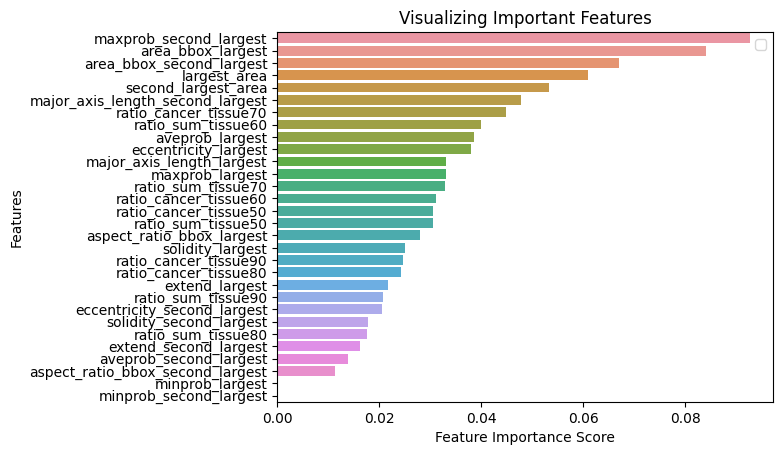

0.845679012345679


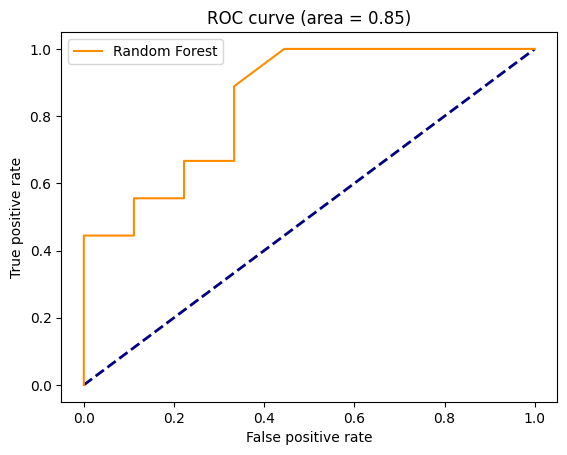

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

# do the real training based on most important features

# X prend toutes les colonnes sauf la colonne de tumeur
X = data.iloc[:, 2:]

# Y prend seulement la  colonne de tumeur
y = data.iloc[:,1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=5) # 70% training and 30% test
clf=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)
scores = clf.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, scores)
print(auc(fpr, tpr))
plt.figure()
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Define lw here
plt.plot(fpr, tpr, color='darkorange', label='Random Forest')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve (area = %0.2f)' % auc(fpr, tpr))
plt.legend(loc='best')
plt.savefig('ROCProb.png')
plt.show()